# 01 — NullVector Ingestion Pipeline

Runs the full NullVector stack on a real PDF and persists all artifacts so
`02_nullvector_langgraph.ipynb` can load them without re-running ingestion.

## Pipeline
```
PDF
 └─► [1] Acquisition       → CanonicalDocumentLedger  (text + visual blocks + PNG crops)
       └─► [2] Tree Build   → HierarchyNodes  (verified heading hierarchy + owned spans)
             └─► [3] Corpus → RetrievalCorpus (page / node / table / visual units)
                   └─► [4] Visual Enrichment  → VisualEnrichmentAttachment × N
                         └─► [5] Augment & Save → enriched_corpus.json
                                                   notebook_config.json  ← read by notebook 2
```

## Key output files
| File | Used by |
|------|---------|
| `enriched_corpus.json` | LangGraph notebook — loads corpus directly |
| `enrichment_attachments.json` | LangGraph notebook — asset path lookup |
| `notebook_config.json` | LangGraph notebook — all paths in one place |

In [1]:
# ── 0. INSTALLATION ──────────────────────────────────────────────────────────
# NullVector version-locks PyMuPDF and pypdf exactly — install these first.
!uv pip install -q "pymupdf==1.27.2" "pypdf==6.8.0" "litellm>=1.40" "pydantic>=2.5"

# Install nullvector from your project root (edit path as needed):
# %pip install -q -e /home/pruthvi/projects/NullVector

In [2]:
# ── 1. CONFIGURATION ─────────────────────────────────────────────────────────
import os, json, hashlib
from pathlib import Path

# ── Credentials ──────────────────────────────────────────────────────────────
OPENROUTER_API_KEY  = "REDACTED_OPENROUTER_KEY"
OPENROUTER_BASE_URL = "https://openrouter.ai/api/v1"

# Vision model used for multimodal enrichment through LiteLLM/OpenRouter.
# Keep the openrouter/... model alias and let LiteLLM route it directly.
# The gateway will still attempt the request when OpenRouter capability metadata is inconclusive.
VISION_LITELLM_MODEL = "openrouter/google/gemini-3.1-flash-lite-preview"

os.environ["OPENROUTER_API_KEY"] = OPENROUTER_API_KEY
os.environ["OPENAI_API_KEY"]     = OPENROUTER_API_KEY   # LiteLLM fallback

# ── PDF ───────────────────────────────────────────────────────────────────────
PDF_PATH = "/home/pruthvi/projects/NullVector/cookbook/903000608.pdf"
assert Path(PDF_PATH).exists(), f"PDF not found: {PDF_PATH}"
print(f"PDF  : {PDF_PATH}")
print(f"Size : {Path(PDF_PATH).stat().st_size:,} bytes")

# ── Artifact directory ────────────────────────────────────────────────────────
# Fixed path so notebook 2 can find artifacts without re-running ingestion.
ARTIFACT_DIR = "/tmp/nullvector_cookbook"
Path(ARTIFACT_DIR).mkdir(parents=True, exist_ok=True)
print(f"Artifacts → {ARTIFACT_DIR}")

# ── Run IDs ───────────────────────────────────────────────────────────────────
ACQ_RUN_ID  = "cookbook-acq-001"
TREE_RUN_ID = "cookbook-tree-001"

# Max visual regions to enrich (controls cost / runtime)
MAX_ENRICHMENTS = 6

PDF  : /home/pruthvi/projects/NullVector/cookbook/903000608.pdf
Size : 6,254,823 bytes
Artifacts → /tmp/nullvector_cookbook


In [3]:
# ── 2. INSPECT THE PDF ───────────────────────────────────────────────────────
import fitz   # PyMuPDF

with fitz.open(PDF_PATH) as doc:
    page_count = doc.page_count
    image_pages = []
    for i in range(page_count):
        p = doc[i]
        n_imgs = len(p.get_image_info())
        if n_imgs:
            image_pages.append((i, n_imgs, len(p.get_text("text"))))
    sample = doc[0].get_text("text")[:300].replace("\n", " ").strip()

print(f"Pages              : {page_count}")
print(f"Pages with images  : {len(image_pages)}")
print(f"\nSample text (p1)   : {sample}")
if image_pages:
    print("\nImage-bearing pages (first 8):")
    for pg, n_img, n_chars in image_pages[:8]:
        print(f"  page {pg+1:3d} : {n_img} image(s), {n_chars:,} text chars")

Pages              : 148
Pages with images  : 81

Sample text (p1)   : 

Image-bearing pages (first 8):
  page   1 : 4 image(s), 0 text chars
  page   3 : 2 image(s), 0 text chars
  page   5 : 1 image(s), 0 text chars
  page   7 : 1 image(s), 0 text chars
  page  11 : 8 image(s), 1,166 text chars
  page  12 : 1 image(s), 1,745 text chars
  page  14 : 1 image(s), 1,406 text chars
  page  15 : 1 image(s), 1,578 text chars


---
## Stage 1 — Acquisition

`AcquisitionService` runs the native PyMuPDF provider which:
- Extracts `TextBlock`, `LineBlock`, `TableArtifact`, `VisualArtifact`, `UnresolvedRegion` per page
- Writes **PNG crops** for every visual block to `assets/pages/<idx>/<id>.png`
- Builds the canonical text substrate (stable byte-level offsets) and tree synthesis projection
- Writes a `CanonicalDocumentLedger` to `ledger/canonical-document-ledger.json`

In [4]:
# ── 3. RUN ACQUISITION ───────────────────────────────────────────────────────
from nullvector.ingest import acquire_document
from nullvector.domain import AcquisitionRequest

acq_request = AcquisitionRequest(
    source_path=PDF_PATH,
    acquisition_run_id=ACQ_RUN_ID,
    artifact_root=ARTIFACT_DIR,
)

print("Running acquisition ...")
acq_manifest = acquire_document(acq_request)
selected_outline = json.loads(Path(acq_manifest.selected_outline_path).read_text(encoding="utf-8"))
ACQ_MANIFEST_PATH = str(Path(acq_manifest.artifact_root) / "manifest.json")

print(f"\n{'='*60}")
print("ACQUISITION COMPLETE")
print(f"{'='*60}")
print(f"Document ID      : {acq_manifest.document_id}")
print(f"Page count       : {acq_manifest.page_count}")
print(f"Outline source   : {acq_manifest.selected_outline_source}")
print(f"Outline entries  : {len(selected_outline['entries'])}")
print(f"Manifest path    : {ACQ_MANIFEST_PATH}")

Running acquisition ...

ACQUISITION COMPLETE
Document ID      : 798d2f27d45d2ccda3694005c2ed60bc0b413b8b299f3a5d4ade7c5867094896
Page count       : 148
Outline source   : pymupdf
Outline entries  : 16
Manifest path    : /tmp/nullvector_cookbook/cookbook-acq-001/798d2f27d45d2ccda3694005c2ed60bc0b413b8b299f3a5d4ade7c5867094896/manifest.json


In [5]:
# ── 4. INSPECT THE CANONICAL LEDGER ─────────────────────────────────────────
from collections import Counter
from nullvector.domain import CanonicalDocumentLedger

ledger = CanonicalDocumentLedger.model_validate_json(
    Path(acq_manifest.ledger_path).read_text(encoding="utf-8")
)

block_counts      = Counter()
visual_blocks     = []   # (page_index, block)
unresolved_blocks = []   # (page_index, block)

for page in ledger.pages:
    for block in page.blocks:
        block_counts[block.block_type] += 1
        if block.block_type == "visual_artifact":
            visual_blocks.append((page.page_index, block))
        elif block.block_type == "unresolved_region":
            unresolved_blocks.append((page.page_index, block))

all_visual = visual_blocks + unresolved_blocks

print("Block type counts:")
for btype, n in sorted(block_counts.items()):
    print(f"  {btype:<24}: {n}")
print(f"\nTotal enrichable blocks : {len(all_visual)}")

print("\nFirst enrichable blocks:")
for pg, blk in all_visual[:6]:
    asset  = blk.asset_path or blk.page_render_path
    bid    = getattr(blk, 'visual_id', None) or getattr(blk, 'region_id', '')
    exists = Path(asset).exists() if asset else False
    print(f"  p{pg+1:3d} | {blk.block_type:<20} | id={bid[:30]}")
    print(f"       asset exists={exists} | {asset}")

Block type counts:
  line_block              : 11079
  table_artifact          : 46
  text_block              : 4005
  unresolved_region       : 12
  visual_artifact         : 213

Total enrichable blocks : 225

First enrichable blocks:
  p  1 | visual_artifact      | id=page-0-visual-0000
       asset exists=True | /tmp/nullvector_cookbook/cookbook-acq-001/798d2f27d45d2ccda3694005c2ed60bc0b413b8b299f3a5d4ade7c5867094896/assets/pages/000000/page-0-visual-0000.png
  p  1 | visual_artifact      | id=page-0-visual-0001
       asset exists=True | /tmp/nullvector_cookbook/cookbook-acq-001/798d2f27d45d2ccda3694005c2ed60bc0b413b8b299f3a5d4ade7c5867094896/assets/pages/000000/page-0-visual-0001.png
  p  1 | visual_artifact      | id=page-0-visual-0003
       asset exists=True | /tmp/nullvector_cookbook/cookbook-acq-001/798d2f27d45d2ccda3694005c2ed60bc0b413b8b299f3a5d4ade7c5867094896/assets/pages/000000/page-0-visual-0003.png
  p  1 | visual_artifact      | id=page-0-visual-0002
       asset exi

**First materialized PNG crop** — page 1, `page-0-visual-0000`

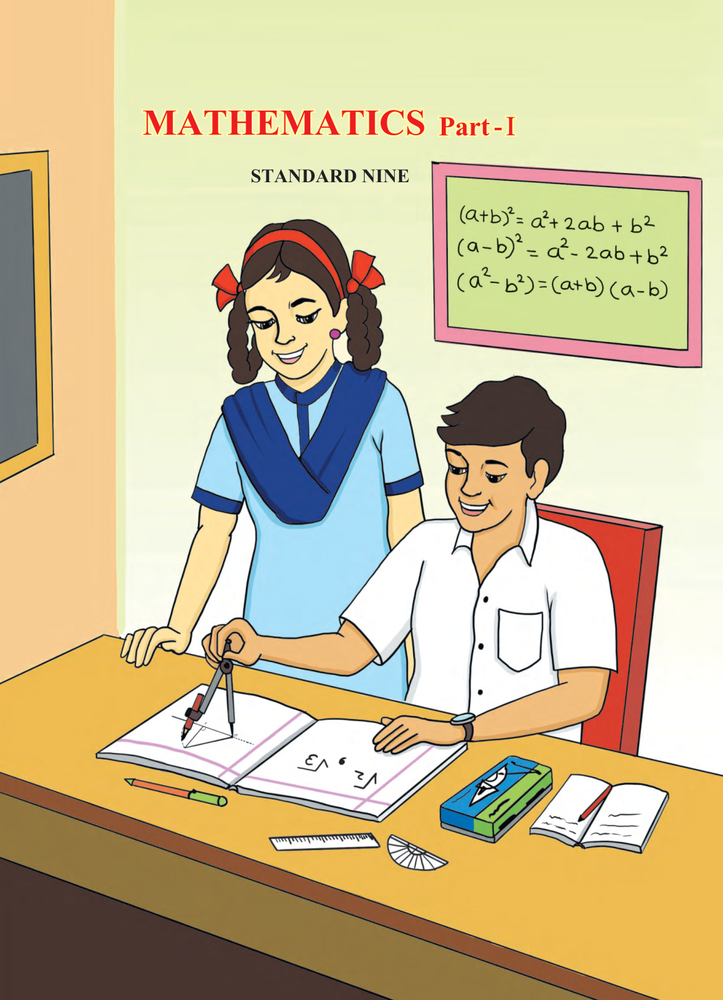

In [6]:
# ── 5. PREVIEW FIRST ASSET (Jupyter) ────────────────────────────────────────
# Display the first materialized PNG crop to verify the asset pipeline.
try:
    from IPython.display import Image, display, Markdown
    for pg, blk in all_visual:
        asset = blk.asset_path or blk.page_render_path
        if asset and Path(asset).exists():
            bid = getattr(blk, 'visual_id', None) or getattr(blk, 'region_id', '')
            display(Markdown(f"**First materialized PNG crop** — page {pg+1}, `{bid}`"))
            display(Image(filename=asset, width=500))
            break
    else:
        print("No asset files found — PDF may have no embedded images.")
except ImportError:
    print("Run in Jupyter to see inline images.")

---
## Stage 2 — Tree Build

Reads the canonical text substrate and runs the deterministic heading pipeline:
1. Score heading candidates (outline + inferred from text / font signals)
2. Select a hierarchy strategy (outline primary → TOC reconciled → inferred deterministic)
3. Verify each node title against its physical page text
4. Emit committed `HierarchyNode` records with owned content spans

In [7]:
# ── 6. RUN TREE BUILD ────────────────────────────────────────────────────────
from nullvector.tree   import build_tree
from nullvector.domain import TreeBuildRequest   # ← from domain, NOT nullvector.tree

tree_request = TreeBuildRequest(
    acquisition_manifest_path=ACQ_MANIFEST_PATH,
    tree_run_id=TREE_RUN_ID,
    summarize=False,
)

print("Building tree ...")
tree_manifest = build_tree(tree_request)
TREE_MANIFEST_PATH = str(Path(tree_manifest.artifact_root) / "manifest.json")

print(f"\n{'='*60}")
print("TREE BUILD COMPLETE")
print(f"{'='*60}")
print(f"Committed nodes   : {tree_manifest.committed_node_count}")
print(f"Unassigned spans  : {tree_manifest.unassigned_span_count}")

nodes_raw = json.loads(Path(tree_manifest.committed_hierarchy_path).read_text())
print(f"\nHierarchy ({len(nodes_raw)} nodes):")
for node in nodes_raw[:20]:
    indent = "  " * (node.get('level', 1) - 1)
    sp = node['page_span']
    print(f"  {indent}[L{node.get('level',1)}] {node.get('title','')}  "
          f"(pp {sp['start_page']+1}–{sp['end_page']+1})")
if len(nodes_raw) > 20:
    print(f"  ... and {len(nodes_raw)-20} more nodes")

Building tree ...

TREE BUILD COMPLETE
Committed nodes   : 3000
Unassigned spans  : 1

Hierarchy (3000 nodes):
  [L1] The Constitution of India  (pp 2–12)
    [L2] Chapter IV A  (pp 2–2)
    [L2] Fundamental Duties  (pp 2–3)
    [L2] Sachin Mehta  (pp 4–4)
    [L2] HARSHWARDHAN OFFSET,KOLHAPUR  (pp 4–4)
    [L2] N/PB/2022-23/1,10,000  (pp 4–10)
    [L2] Sets  (pp 11–11)
    [L2] • Equal sets, subset 	 •  Universal set  (pp 11–11)
    [L2] • Intersection and Union of sets  (pp 11–11)
    [L2] • Number of elements in a set  (pp 11–11)
    [L2] Flower  (pp 11–11)
    [L2] Sets  (pp 12–12)
    [L2] Q ={ q  (pp 13–13)
    [L2] p  such that  p and q are integers  (pp 13–13)
    [L2] where q is a non-zero number.’  (pp 13–13)
    [L2] B = { -3, 3}  (pp 13–13)
    [L2] C = { 5, 10, 15, 20, 25}  (pp 13–13)
    [L2] Rule Method  (pp 13–13)
    [L2] M = {1, 8, 27, 64, 125.......}  (pp 13–13)
    [L2] Practice set 1.1  (pp 13–13)
  ... and 2980 more nodes


---
## Stage 3 — Retrieval Corpus

`RetrievalCorpusBuilder` assembles all evidence unit types:

| Unit type | Source | Text available? |
|-----------|--------|----------------|
| `page_text` | Canonical text substrate | ✓ always |
| `node_text` | Owned span per hierarchy node | ✓ always |
| `table` | Detected tabular regions | ✓ markdown projection |
| `visual` | VisualArtifact blocks | ✗ until enriched |
| `unresolved_visual` | UnresolvedRegion blocks | ✗ until enriched |
| `unassigned_span` | Pages with no verified node | ✓ always |

In [8]:
# ── 7. BUILD RETRIEVAL CORPUS ────────────────────────────────────────────────
from nullvector.retrieval import (
    RetrievalCorpusBuilder, load_retrieval_corpus,
    InMemoryRetrievalIndex, QueryPlanner, RetrievalRanker, RetrievalService,
)

retrieval_manifest = RetrievalCorpusBuilder().build(
    acquisition_manifest_path=ACQ_MANIFEST_PATH,
    tree_manifest_path=TREE_MANIFEST_PATH,
)
corpus = load_retrieval_corpus(retrieval_manifest.corpus_path)

print(f"{'='*60}")
print("RETRIEVAL CORPUS BUILT")
print(f"{'='*60}")
print(f"Total units  : {retrieval_manifest.unit_count}")
for utype, n in sorted(Counter(u.unit_type.value for u in corpus.units).items()):
    print(f"  {utype:<24}: {n}")

# Sanity check
planner = QueryPlanner()
ranker  = RetrievalRanker()
service = RetrievalService(planner, ranker)
hits = service.search(corpus=corpus, query="main topic overview", limit=3)
print("\nSanity check — 'main topic overview':")
for h in hits:
    snippet = (h.unit.text or "")[:100].replace("\n", " ")
    print(f"  [{h.unit.unit_type.value}] p{h.unit.page_span.start_page+1} "
          f"score={h.score:.1f} | {snippet}")

RETRIEVAL CORPUS BUILT
Total units  : 3412
  node_text               : 3000
  page_text               : 140
  table                   : 46
  unassigned_span         : 1
  unresolved_visual       : 12
  visual                  : 213

Sanity check — 'main topic overview':
  [node_text] p111 score=5.0 | Computation of income tax As income tax is a tax levied on income, it is necessary to know about the
  [node_text] p103 score=5.0 | Mother :	 Ok, let's buy it next year. Anagha : 	Mamma, why not now ? Mother : 	Anagha, you don't kno
  [node_text] p103 score=5.0 | • Introduction to • Savings and Investments financial planning • Tax structure • Computation of Inco


---
## Stage 4 — Visual Enrichment (Multimodal)

For each visual block that has a PNG crop on disk:

1. `VisualEnrichmentService.enrich()` encodes the PNG as base64 and sends it to the vision LLM
2. The LLM returns a `VisualInsightResponse` (structured: `summary`, `labels`, `attributes`, `confidence`)
3. NullVector wraps this in a `VisualEnrichmentAttachment` and returns it
4. `augment_corpus_with_attachments()` folds it into the corpus: `unit.text ← summary`, `unit.keywords ← labels`

After this stage, visual corpus units are **fully text-searchable** alongside page and node text.

In [9]:
# ── 8. CONFIGURE MULTIMODAL GATEWAY ─────────────────────────────────────────
from nullvector.llm.multimodal_gateway import (
    MultimodalGatewayService, MultimodalGatewayConfig,
    MultimodalProviderConfig, VisualEnrichmentService,
)

mm_gateway = MultimodalGatewayService(
    MultimodalGatewayConfig(
        provider=MultimodalProviderConfig(
            provider="litellm_multimodal",
            model=VISION_LITELLM_MODEL,
            api_key_env_var="OPENROUTER_API_KEY",
            extra_body={
                "api_base": OPENROUTER_BASE_URL,
            },
        ),
        timeout_seconds=45.0,
        audit_root=None,
    )
)
enrichment_service = VisualEnrichmentService(mm_gateway)
print(f"Multimodal gateway ready — model: {VISION_LITELLM_MODEL}")

Multimodal gateway ready — model: openrouter/google/gemini-3.1-flash-lite-preview


In [10]:
# ── 9. ENRICH VISUAL REGIONS ─────────────────────────────────────────────────
from nullvector.domain import VisualEnrichmentRequest, VisualRegionReference
from nullvector.llm.multimodal_gateway import MultimodalGatewayError

def _make_enrichment_request(page_index: int, blk) -> VisualEnrichmentRequest:
    is_visual = blk.block_type == "visual_artifact"
    region_id = blk.visual_id if is_visual else blk.region_id
    req_id = hashlib.sha256(f"{ledger.document_id}:{region_id}".encode()).hexdigest()[:24]
    return VisualEnrichmentRequest(
        request_id=req_id,
        region=VisualRegionReference(
            document_id=ledger.document_id,
            page_index=page_index,
            region_id=region_id,
            bbox=blk.bbox,
            asset_path=blk.asset_path,
            page_render_path=blk.page_render_path,
            render_dpi=getattr(blk, 'render_dpi', None),
        ),
        prompt=(
            "Describe this image concisely but completely. Identify: "
            "(1) the visual type — chart, diagram, photograph, map, screenshot, etc., "
            "(2) key data, values, or information shown, "
            "(3) any visible text, axis titles, legends, or captions. "
            "Be specific. Ground everything in what is visually present."
        ),
    )


enrichment_attachments = []
attempted_count  = 0
enriched_count   = 0
failed_count     = 0
skipped_no_asset = 0

print(f"Enriching up to {MAX_ENRICHMENTS} visual region(s) ...\n")

for page_index, blk in all_visual:
    if attempted_count >= MAX_ENRICHMENTS:
        break
    asset = blk.asset_path or blk.page_render_path
    if not asset or not Path(asset).exists():
        skipped_no_asset += 1
        continue

    try:
        attempted_count += 1
        att = enrichment_service.enrich(_make_enrichment_request(page_index, blk))
        enrichment_attachments.append(att)
        enriched_count += 1
        bid = blk.visual_id if blk.block_type == "visual_artifact" else blk.region_id
        print(f"✓  p{page_index+1:3d}  [{bid[:34]}]")
        print(f"   summary    : {att.insight.summary[:150]}")
        print(f"   labels     : {list(att.insight.labels)[:6]}")
        print(f"   confidence : {att.confidence}")
        print()
    except MultimodalGatewayError as exc:
        failed_count += 1
        bid = blk.visual_id if blk.block_type == "visual_artifact" else blk.region_id
        print(f"✗  p{page_index+1:3d}  [{bid[:28]}]  "
              f"{exc.failure.category.value}: {exc.failure.message[:80]}")
    except Exception as exc:
        failed_count += 1
        print(f"✗  p{page_index+1:3d}  unexpected: {exc}")

print(f"{'─'*60}")
print(
    f"Attempted : {attempted_count}  |  Enriched : {enriched_count}  |  "
    f"Failed : {failed_count}  |  Skipped (no asset): {skipped_no_asset}"
)

Enriching up to 6 visual region(s) ...


Provider List: https://docs.litellm.ai/docs/providers


Provider List: https://docs.litellm.ai/docs/providers


✓  p  1  [page-0-visual-0000]
   summary    : This is the front cover of a textbook titled 'MATHEMATICS Part-I Standard Nine'. The illustration features a young girl standing and a young boy sitti
   labels     : ['textbook cover', 'mathematics', 'students', 'educational', 'algebra', 'illustration']
   confidence : 1.0

Provider List: https://docs.litellm.ai/docs/providers


Provider List: https://docs.litellm.ai/docs/providers


Provider List: https://docs.litellm.ai/docs/providers

✓  p  1  [page-0-visual-0001]
Provider List: https://docs.litellm.ai/docs/providers


   summary    : The image is a textbook cover illustration for a ninth-grade mathematics book. It features a girl and a boy at a desk, with the boy using a compass to
   labels     : ['textbook cover', 'illustration', 'algebraic formulas', 'students', 'mathematics']
   co

---
**Visual 1 / 6** — page 1 | `page-0-visual-0000`

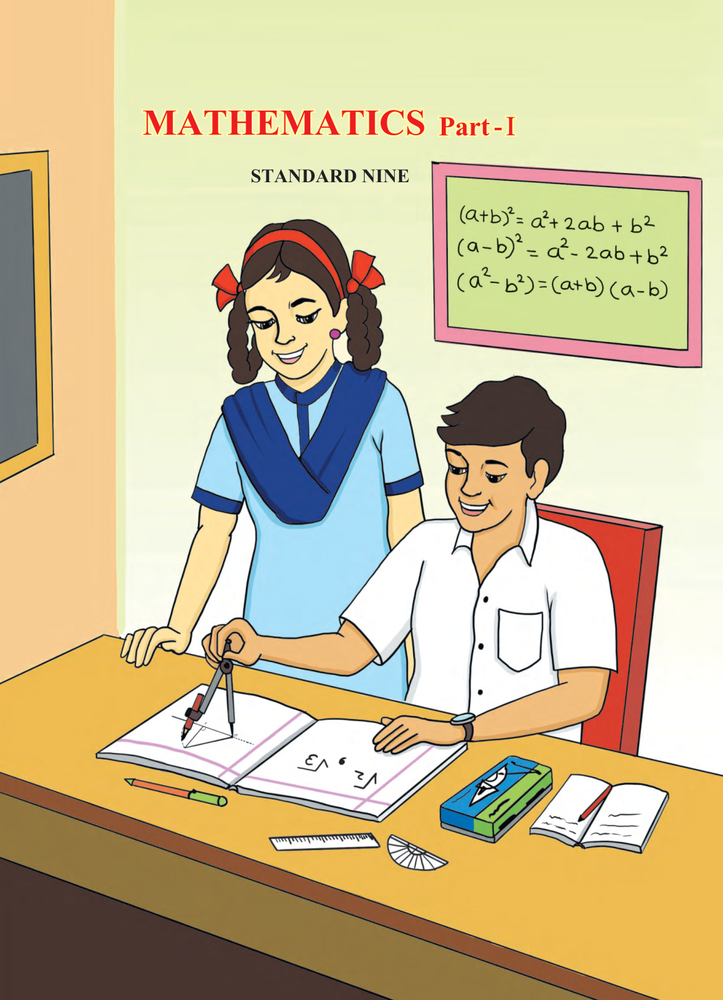

**Summary:** This is the front cover of a textbook titled 'MATHEMATICS Part-I Standard Nine'. The illustration features a young girl standing and a young boy sitting at a desk. The boy is using a pair of compasses to draw a triangle in an open notebook, while the girl watches. On the desk are also a pencil, a ruler, a protractor, an eraser case, and another small notebook with '√2, √3' written on it. Behind them is a pink-framed green chalkboard displaying three algebraic equations.

**Labels:** textbook cover, mathematics, students, educational, algebra, illustration | **Confidence:** 1.0

---
**Visual 2 / 6** — page 1 | `page-0-visual-0001`

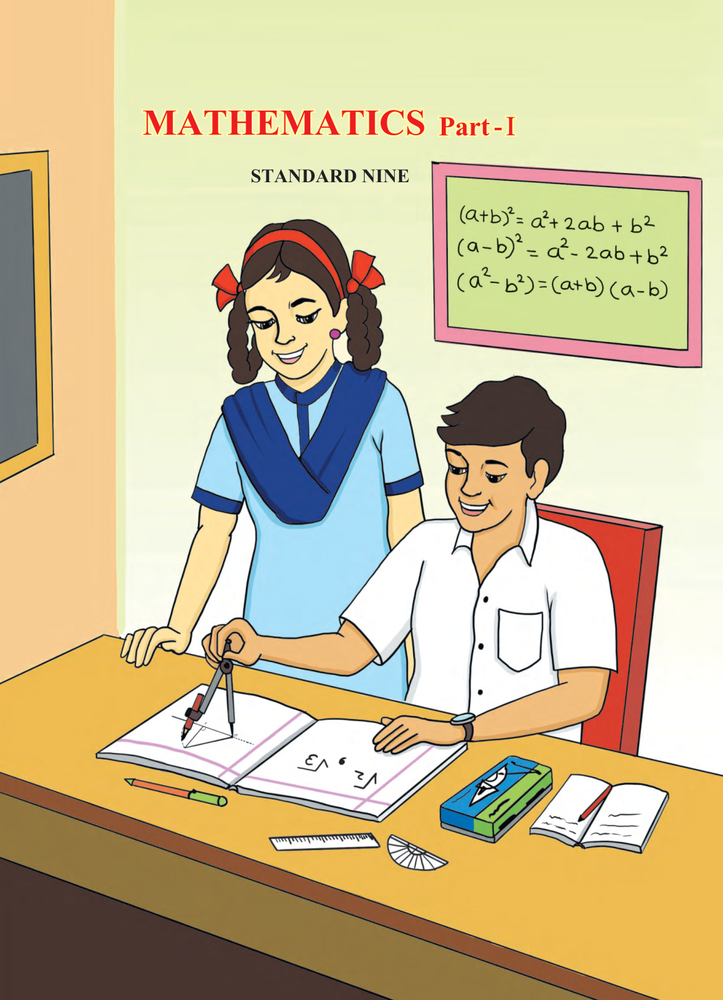

**Summary:** The image is a textbook cover illustration for a ninth-grade mathematics book. It features a girl and a boy at a desk, with the boy using a compass to draw in an open notebook. A chalkboard in the background displays algebraic identities: (a+b)^2 = a^2+2ab+b^2, (a-b)^2 = a^2-2ab+b^2, and (a^2-b^2)=(a+b)(a-b).

**Labels:** textbook cover, illustration, algebraic formulas, students, mathematics | **Confidence:** 0.95

---
**Visual 3 / 6** — page 1 | `page-0-visual-0003`

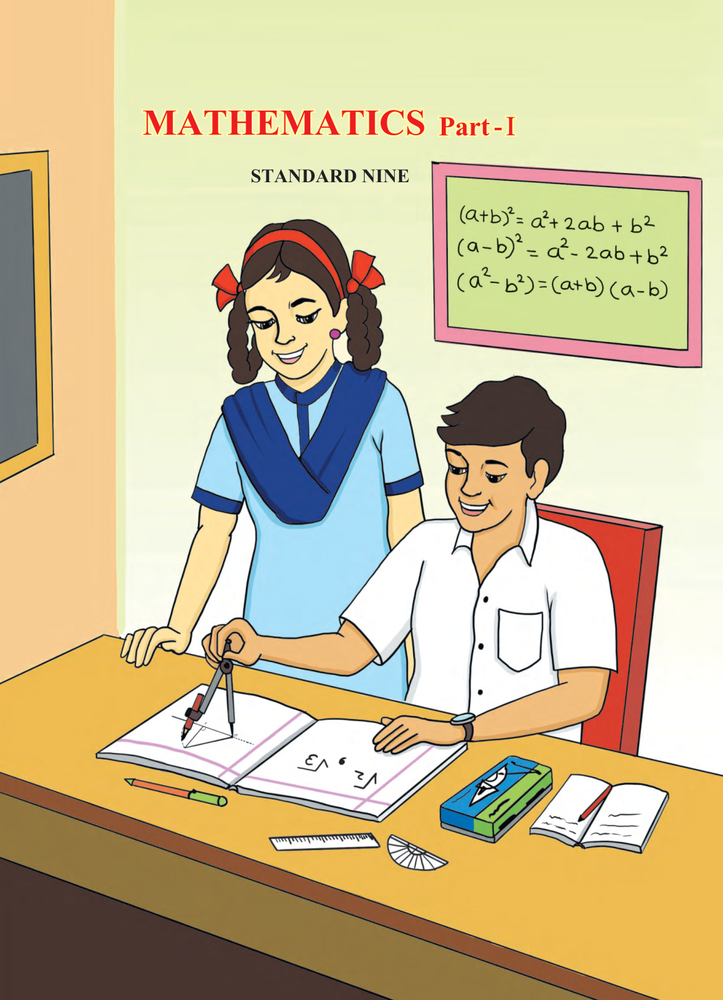

**Summary:** This is an illustration for a 'Mathematics Part-I' textbook cover for 'Standard Nine'. It depicts a male student sitting at a desk studying with a female student standing behind him, as they work together on geometric constructions. Algebraic formulas are written on a blackboard in the background, specifically (a+b)^2 = a^2 + 2ab + b^2, (a-b)^2 = a^2 - 2ab + b^2, and (a^2-b^2) = (a+b)(a-b).

**Labels:** mathematics textbook cover, educational illustration, algebraic formulas, students studying | **Confidence:** 1.0

---
**Visual 4 / 6** — page 1 | `page-0-visual-0002`

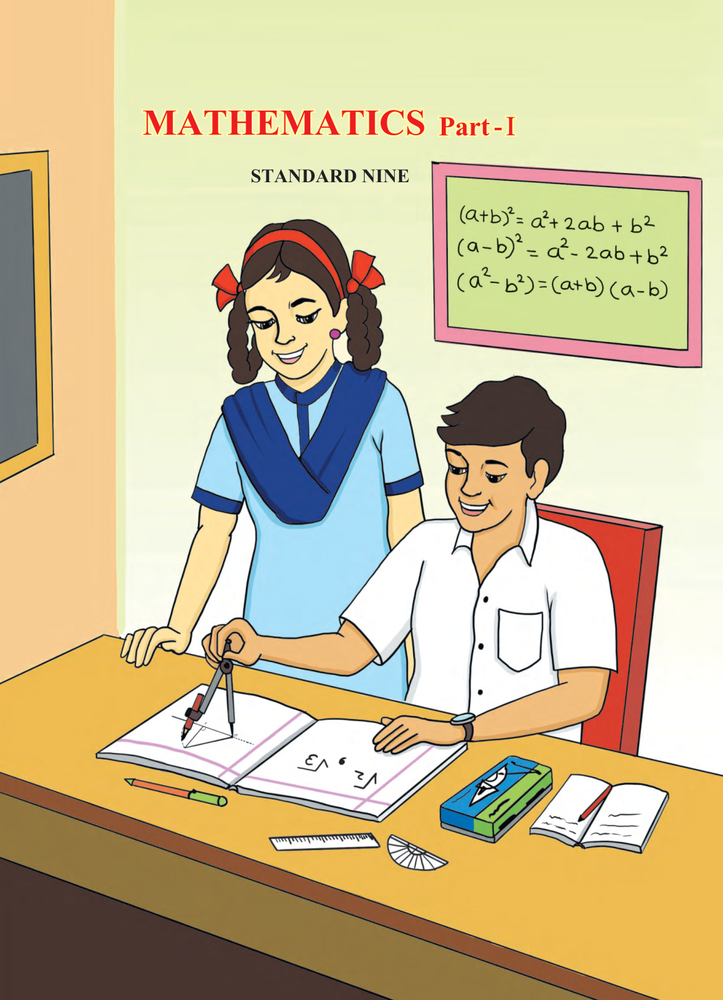

**Summary:** This is a digital illustration forming the cover of a 'STANDARD NINE Mathematics Part-I' textbook. It depicts a male student sitting at a desk engaged in geometry work using a compass and protractor while a female student stands beside him. A chalkboard on the wall in the background displays three algebraic identities: (a+b)^2 = a^2+2ab+b^2, (a-b)^2 = a^2-2ab+b^2, and (a^2-b^2) = (a+b)(a-b).

**Labels:** textbook cover, illustration, mathematics, algebra, geometry, students, education | **Confidence:** 0.95

---
**Visual 5 / 6** — page 3 | `page-2-visual-0000`

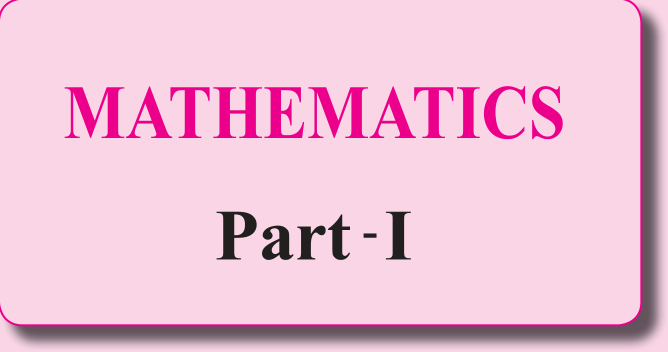

**Summary:** This is a graphic element, likely a book cover or title card, consisting of a rounded rectangle with a light pink background. Inside are the bold, pink-colored letters spelling 'MATHEMATICS' in large, capitalized font, followed by the black text 'Part-I' immediately below.

**Labels:** mathematics, text, graphic design, title | **Confidence:** 0.95

---
**Visual 6 / 6** — page 3 | `page-2-visual-0001`

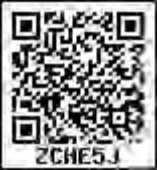

**Summary:** This image is a black and white QR code featuring the alphanumeric text 'ZCHE5J' printed directly below it.

**Labels:** QR code, text | **Confidence:** 1.0

In [11]:
# ── 10. DISPLAY ALL ENRICHED IMAGES (Jupyter) ────────────────────────────────
try:
    from IPython.display import Image, display, Markdown

    # Build region_id → corpus unit lookup
    unit_by_region = {
        u.visual_region.region_id: u
        for u in corpus.units
        if u.unit_type.value in ("visual", "unresolved_visual")
        and u.visual_region is not None
    }

    for i, att in enumerate(enrichment_attachments):
        unit  = unit_by_region.get(att.region_id)
        asset = (unit.asset_path if unit else None) \
             or (unit.page_render_path if unit else None)
        page_num = (unit.page_span.start_page + 1) if unit else "?"

        display(Markdown(
            f"---\n**Visual {i+1} / {len(enrichment_attachments)}** "
            f"— page {page_num} | `{att.region_id[:40]}`"
        ))
        if asset and Path(asset).exists():
            display(Image(filename=asset, width=460))
        else:
            display(Markdown("*Asset not available for display.*"))
        display(Markdown(
            f"**Summary:** {att.insight.summary}\n\n"
            f"**Labels:** {', '.join(att.insight.labels) or 'none'} "
            f"| **Confidence:** {att.confidence}"
        ))

except ImportError:
    for att in enrichment_attachments:
        print(f"{att.region_id[:36]}: {att.insight.summary[:120]}")

In [12]:
# ── 11. AUGMENT CORPUS ───────────────────────────────────────────────────────
from nullvector.retrieval import augment_corpus_with_attachments

if enrichment_attachments:
    enriched_corpus = augment_corpus_with_attachments(
        corpus=corpus,
        attachments=tuple(enrichment_attachments),
    )
    print(f"Corpus augmented with {len(enrichment_attachments)} attachment(s).")
else:
    enriched_corpus = corpus
    print("No enrichments — corpus unchanged.")

visual_with_text = [
    u for u in enriched_corpus.units
    if u.unit_type.value in ("visual", "unresolved_visual") and u.text
]
print(f"Visual units now with searchable text: {len(visual_with_text)}")
for u in visual_with_text:
    print(f"  p{u.page_span.start_page+1} | {(u.text or '')[:100]}")

Corpus augmented with 6 attachment(s).
Visual units now with searchable text: 6
  p1 | This is the front cover of a textbook titled 'MATHEMATICS Part-I Standard Nine'. The illustration fe
  p1 | The image is a textbook cover illustration for a ninth-grade mathematics book. It features a girl an
  p1 | This is an illustration for a 'Mathematics Part-I' textbook cover for 'Standard Nine'. It depicts a 
  p1 | This is a digital illustration forming the cover of a 'STANDARD NINE Mathematics Part-I' textbook. I
  p3 | This is a graphic element, likely a book cover or title card, consisting of a rounded rectangle with
  p3 | This image is a black and white QR code featuring the alphanumeric text 'ZCHE5J' printed directly be


In [13]:
# ── 12. SAVE ARTIFACTS FOR NOTEBOOK 2 ───────────────────────────────────────
from pydantic import BaseModel

def _json_safe(v):
    if isinstance(v, BaseModel): return v.model_dump(mode="json")
    if isinstance(v, dict):      return {str(k): _json_safe(x) for k, x in v.items()}
    if isinstance(v, (list, tuple)): return [_json_safe(x) for x in v]
    return v

enriched_corpus_path = Path(ARTIFACT_DIR) / "enriched_corpus.json"
enriched_corpus_path.write_text(
    json.dumps(_json_safe(enriched_corpus), indent=2, ensure_ascii=True), "utf-8"
)

attachments_path = Path(ARTIFACT_DIR) / "enrichment_attachments.json"
attachments_path.write_text(
    json.dumps([_json_safe(a) for a in enrichment_attachments], indent=2, ensure_ascii=True), "utf-8"
)

nb_config = {
    "document_id"                : acq_manifest.document_id,
    "page_count"                 : acq_manifest.page_count,
    "acq_manifest_path"          : ACQ_MANIFEST_PATH,
    "tree_manifest_path"         : TREE_MANIFEST_PATH,
    "retrieval_corpus_path"      : retrieval_manifest.corpus_path,
    "enriched_corpus_path"       : str(enriched_corpus_path),
    "enrichment_attachments_path": str(attachments_path),
    "artifact_dir"               : ARTIFACT_DIR,
    "pdf_path"                   : PDF_PATH,
    "n_enriched_visuals"         : len(enrichment_attachments),
    "vision_litellm_model"       : VISION_LITELLM_MODEL,
}
config_path = Path(ARTIFACT_DIR) / "notebook_config.json"
config_path.write_text(json.dumps(nb_config, indent=2), "utf-8")

print(f"{'='*60}")
print("ALL ARTIFACTS SAVED")
print(f"{'='*60}")
print(f"Enriched corpus      : {enriched_corpus_path}")
print(f"Attachments          : {attachments_path}")
print(f"Notebook config      : {config_path}")
print()
print("→ Open 02_nullvector_langgraph.ipynb to continue.")

ALL ARTIFACTS SAVED
Enriched corpus      : /tmp/nullvector_cookbook/enriched_corpus.json
Attachments          : /tmp/nullvector_cookbook/enrichment_attachments.json
Notebook config      : /tmp/nullvector_cookbook/notebook_config.json

→ Open 02_nullvector_langgraph.ipynb to continue.


In [14]:
# ── 13. ARTIFACT TREE ────────────────────────────────────────────────────────
print(f"{'='*60}")
print(f"Files in {ARTIFACT_DIR}:")
print(f"{'='*60}")
for item in sorted(Path(ARTIFACT_DIR).rglob("*")):
    if item.is_file():
        rel  = item.relative_to(ARTIFACT_DIR)
        size = item.stat().st_size / 1024
        print(f"  {str(rel):<65} {size:>8.1f} KB")

Files in /tmp/nullvector_cookbook:
  _tree_runs/cookbook-tree-001/run-index.json                            0.8 KB
  cookbook-acq-001/798d2f27d45d2ccda3694005c2ed60bc0b413b8b299f3a5d4ade7c5867094896/assets/pages/000000/page-0-unresolved-0000.png   1529.7 KB
  cookbook-acq-001/798d2f27d45d2ccda3694005c2ed60bc0b413b8b299f3a5d4ade7c5867094896/assets/pages/000000/page-0-unresolved-0001.png   1529.7 KB
  cookbook-acq-001/798d2f27d45d2ccda3694005c2ed60bc0b413b8b299f3a5d4ade7c5867094896/assets/pages/000000/page-0-unresolved-0002.png   1529.7 KB
  cookbook-acq-001/798d2f27d45d2ccda3694005c2ed60bc0b413b8b299f3a5d4ade7c5867094896/assets/pages/000000/page-0-unresolved-0003.png   1529.7 KB
  cookbook-acq-001/798d2f27d45d2ccda3694005c2ed60bc0b413b8b299f3a5d4ade7c5867094896/assets/pages/000000/page-0-visual-0000.png   1529.7 KB
  cookbook-acq-001/798d2f27d45d2ccda3694005c2ed60bc0b413b8b299f3a5d4ade7c5867094896/assets/pages/000000/page-0-visual-0001.png   1529.7 KB
  cookbook-acq-001/798d2f27d45d2ccd